# Notebook 26 — Modèle couleur : décomposition intrinsèque (albédo / shading)

## Pourquoi ce troisième modèle

Dans le notebook 25, la « branche couleur » n'était **pas un modèle** : c'était la luminance BT.601 calculée directement sur les pixels RGB.

**Le problème fondamental de cette approche :** la luminance mélange deux choses différentes.

```
Pixel sombre  =  matériau sombre  ×  peu de lumière (ombre)
```

Un trottoir en béton clair **à l'ombre** donne la même luminance qu'un trottoir en asphalte sombre **au soleil**. Le pipeline leur attribuait donc le même albédo — ce qui est faux.

## La solution : Intrinsic Image Decomposition (IID)

L'IID est le domaine de vision par ordinateur dédié exactement à ce problème. Il décompose une image en deux couches :

$$I = A \times S$$

| Composante | Signification | Ce qu'on en fait |
|---|---|---|
| **A** (albedo / reflectance) | couleur **intrinsèque** du matériau, **invariante à l'éclairage** | → c'est ce qu'on veut pour l'albédo thermique |
| **S** (shading) | ombres, éclairage, géométrie | → écarté (mais utile pour détecter les zones ombragées) |

## Modèle retenu : **Intrinsic (Careaga & Aksoy)**

| Critère | Détail |
|---|---|
| Publication | *Intrinsic Image Decomposition via Ordinal Shading*, ACM TOG 2023 + *Colorful Diffuse Intrinsic Image Decomposition in the Wild*, ACM TOG 2024 |
| Auteurs | Chris Careaga, Yağız Aksoy (Simon Fraser University) |
| Code + poids | https://github.com/compphoto/Intrinsic (public, pré-entraîné) |
| Papier | https://arxiv.org/abs/2311.12792 |
| Page projet | https://yaksoy.github.io/intrinsic/ |
| Atout | conçu pour les images **in-the-wild** haute résolution — adapté à vos photos de rue |
| Licence | **usage académique uniquement** — compatible avec votre stage, à citer dans le rapport |

**Alternatives considérées et écartées :**
- *Direct Intrinsics* (arXiv 1512.02311) — CNN de 2015, dépassé
- *DARN* (arXiv 1612.07899) — réseau adversarial, pas de poids publics simples
- *SAIL* (arXiv 2505.19751, 2025) — diffusion auto-supervisée, très récent, plus lourd à déployer
- Revue complète du domaine : *A Survey on Intrinsic Images* (arXiv 2112.03842)

## Ce que produit ce notebook

1. Carte d'**albédo intrinsèque** (RGB, invariante à l'éclairage) pour les 116 images
2. Carte de **shading** (utile pour identifier les zones ombragées)
3. **Comparaison quantitative** luminance BT.601 (nb25) vs albédo intrinsèque, par classe sémantique
4. Export `.npy` réutilisable directement dans le notebook 25 en remplacement de la luminance

## 1. Installation du modèle

Le paquet s'installe depuis GitHub. Les poids se téléchargent automatiquement au premier chargement.

⚠️ **À exécuter une seule fois.** Redémarrer le kernel après installation.

In [1]:
# --- Installation (a executer une fois, puis redemarrer le kernel) ---
# Decommenter les 3 lignes ci-dessous au premier lancement :

# !pip install https://github.com/compphoto/Intrinsic/archive/main.zip
# !pip install git+https://github.com/CCareaga/chrislib
# !pip install timm==0.6.13

print("Si c'est le premier lancement : decommenter les lignes ci-dessus, executer, "
      "puis REDEMARRER LE KERNEL avant de continuer.")

     - 0 bytes ? 0:00:00
     | 463.7 kB 3.7 MB/s 0:00:00
     - 3.6 MB 10.5 MB/s 0:00:00
     / 5.0 MB 10.7 MB/s 0:00:00
     \ 5.6 MB 7.6 MB/s 0:00:00
     - 8.2 MB 8.6 MB/s 0:00:01
     | 11.0 MB 9.4 MB/s 0:00:01
     - 13.5 MB 9.7 MB/s 0:00:01
     / 16.5 MB 10.2 MB/s 0:00:01
     \ 19.0 MB 10.5 MB/s 0:00:01
     - 20.4 MB 10.0 MB/s 0:00:02
     | 21.9 MB 9.8 MB/s 0:00:02
     - 23.7 MB 9.7 MB/s 0:00:02
     / 25.4 MB 9.6 MB/s 0:00:02
     \ 27.4 MB 9.5 MB/s 0:00:02
     - 28.2 MB 9.5 MB/s 0:00:03
     | 30.4 MB 9.2 MB/s 0:00:03
     \ 33.0 MB 9.4 MB/s 0:00:03
     / 33.7 MB 9.1 MB/s 0:00:03
     \ 34.3 MB 8.7 MB/s 0:00:03
     - 35.6 MB 8.6 MB/s 0:00:04
     | 37.1 MB 8.6 MB/s 0:00:04
     \ 38.2 MB 8.5 MB/s 0:00:04
     | 38.2 MB 8.5 MB/s 0:00:04
  Installing build dependencies: started
  Installing build dependencies: finished with status 'done'
  Getting requirements to build wheel: started
  Getting requirements to build wheel: finished with status 'done'
  Preparing metadata 

  Running command git clone --filter=blob:none --quiet https://github.com/CCareaga/MiDaS 'C:\Users\youss\AppData\Local\Temp\pip-install-wlzb19lm\altered-midas_ed60579538874256b9d90d623ae1a258'
  Running command git checkout -q fb51e3a
  Running command git clone --filter=blob:none --quiet https://github.com/CCareaga/chrislib 'C:\Users\youss\AppData\Local\Temp\pip-install-wlzb19lm\chrislib_30d94aa573e14a90bf95c62f65e5fb8b'
  Running command git checkout -q 9a4c63f
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
openxlab 0.1.3 requires requests~=2.28.2, but you have requests 2.33.1 which is incompatible.
openxlab 0.1.3 requires tqdm~=4.65.0, but you have tqdm 4.70.0 which is incompatible.


  Cloning https://github.com/CCareaga/chrislib to C:\Users\youss\AppData\Local\Temp\pip-req-build-cfayyha8
  Resolved https://github.com/CCareaga/chrislib to commit 9a4c63f5fc5e7bbe62288f2777c527b706eb04d0
  Installing build dependencies: started
  Installing build dependencies: finished with status 'done'
  Getting requirements to build wheel: started
  Getting requirements to build wheel: finished with status 'done'
  Preparing metadata (pyproject.toml): started
  Preparing metadata (pyproject.toml): finished with status 'done'


  Running command git clone --filter=blob:none --quiet https://github.com/CCareaga/chrislib 'C:\Users\youss\AppData\Local\Temp\pip-req-build-cfayyha8'


   ---------------------------------------- 0.0/549.1 kB ? eta -:--:--
   ---------------------------------------- 549.1/549.1 kB 9.3 MB/s  0:00:00
  Attempting uninstall: timm
    Found existing installation: timm 1.0.28
    Uninstalling timm-1.0.28:
      Successfully uninstalled timm-1.0.28
Si c'est le premier lancement : decommenter les lignes ci-dessus, executer, puis REDEMARRER LE KERNEL avant de continuer.


## 2. Environnement + vérification de l'API

Le dépôt a évolué entre les versions 2023 et 2024 : cette cellule **vérifie l'API réellement disponible** dans votre installation avant de lancer quoi que ce soit, plutôt que de supposer.

In [2]:
import time, random
from pathlib import Path

import numpy as np
import cv2
import torch
import pandas as pd
from PIL import Image
import matplotlib.pyplot as plt

device = "cuda" if torch.cuda.is_available() else "cpu"
print(f"Device : {device}")

# --- Verification de l'API disponible ---
try:
    import intrinsic
    from intrinsic.pipeline import run_pipeline, load_models

    print("Import OK : intrinsic.pipeline.run_pipeline + load_models")

    import inspect

    print("\nSignature de run_pipeline :")
    print(" ", inspect.signature(run_pipeline))

    print("\nSignature de load_models :")
    print(" ", inspect.signature(load_models))

except ImportError as e:
    print(f"!! Import échoue : {e}")
    print("   -> executer la cellule d'installation ci-dessus, puis redemarrer le kernel")
    print("   -> verifier aussi le README : https://github.com/compphoto/Intrinsic")

PROJECT_ROOT = Path("..").resolve()
DATASET_DIR  = PROJECT_ROOT / "data" / "outputs" / "dataset_coolpath_360"
IMG_DIR      = DATASET_DIR / "images"
LBL_DIR      = DATASET_DIR / "labels"
SEM_MASKS_DIR = PROJECT_ROOT / "data" / "outputs" / "fusion_3models_v2" / "masks_semantic"

OUTPUT_DIR    = PROJECT_ROOT / "data" / "outputs" / "intrinsic_color"
ALBEDO_INT_DIR = OUTPUT_DIR / "albedo_intrinsic"    # .npy RGB float32
SHADING_DIR    = OUTPUT_DIR / "shading"             # .npy float32
VIZ_DIR        = OUTPUT_DIR / "viz"
for d in (OUTPUT_DIR, ALBEDO_INT_DIR, SHADING_DIR, VIZ_DIR):
    d.mkdir(parents=True, exist_ok=True)

image_paths = sorted(list(IMG_DIR.glob("*.jpg")) + list(IMG_DIR.glob("*.png")))
print(f"\n{len(image_paths)} images a traiter")

Device : cuda
Import OK : intrinsic.pipeline.run_pipeline + load_models

Signature de run_pipeline :
  (models, img_arr, stage=4, resize_conf=0.0, base_size=384, linear=False, device='cuda')

Signature de load_models :
  (path, stage=4, device='cuda', compiled=False, chroma_dpt=False, alb_residual=False)

116 images a traiter


## 3. Chargement du modèle pré-entraîné

Les poids (`paper_weights`) se téléchargent automatiquement au premier appel (~quelques centaines de Mo).

In [3]:
t0 = time.time()
intrinsic_model = load_models("paper_weights")
print(f"Modele charge en {time.time()-t0:.0f}s")
print(f"Composants : {list(intrinsic_model.keys()) if isinstance(intrinsic_model, dict) else type(intrinsic_model)}")

Downloading: "https://github.com/compphoto/Intrinsic/releases/download/v1.0/final_weights.pt" to C:\Users\youss/.cache\torch\hub\checkpoints\final_weights.pt
100%|██████████| 485M/485M [00:46<00:00, 10.9MB/s] 
Downloading: "https://github.com/facebookresearch/WSL-Images/zipball/main" to C:\Users\youss/.cache\torch\hub\main.zip
Downloading: "https://download.pytorch.org/models/ig_resnext101_32x8-c38310e5.pth" to C:\Users\youss/.cache\torch\hub\checkpoints\ig_resnext101_32x8-c38310e5.pth
100%|██████████| 340M/340M [00:32<00:00, 11.1MB/s] 
C:\Users\youss\miniconda3\envs\coolpath\lib\site-packages\torch\hub.py:294: UserWarning: You are about to download and run code from an untrusted repository. In a future release, this won't be allowed. To add the repository to your trusted list, change the command to {calling_fn}(..., trust_repo=False) and a command prompt will appear asking for an explicit confirmation of trust, or load(..., trust_repo=True), which will assume that the prompt is to be 

Modele charge en 85s
Composants : ['ord_model', 'iid_model']


## 4. Inférence sur les 116 images

Sauvegarde de l'albédo intrinsèque (RGB) et du shading. Reprise automatique : les images déjà traitées sont sautées.

⏱️ Compter ~2–5 s/image sur GPU → **5–10 min pour 116 images**.

In [6]:
import torch

print("Avant :", intrinsic_model.keys())

intrinsic_model = load_models(
    "v2",
    stage=4,
    device=device,
    compiled=False,
    chroma_dpt=False,
    alb_residual=False
)

print("Après :", intrinsic_model.keys())

Avant : dict_keys(['ord_model', 'iid_model'])
loading v2 weights


Downloading: "https://github.com/compphoto/Intrinsic/releases/download/v2.0/stage_0.pt" to C:\Users\youss/.cache\torch\hub\checkpoints\stage_0.pt
100%|██████████| 403M/403M [00:29<00:00, 14.1MB/s] 
Downloading: "https://github.com/compphoto/Intrinsic/releases/download/v2.0/stage_1.pt" to C:\Users\youss/.cache\torch\hub\checkpoints\stage_1.pt
100%|██████████| 81.8M/81.8M [00:04<00:00, 17.8MB/s]
Downloading: "https://github.com/compphoto/Intrinsic/releases/download/v2.0/stage_2.pt" to C:\Users\youss/.cache\torch\hub\checkpoints\stage_2.pt
100%|██████████| 403M/403M [00:25<00:00, 16.3MB/s] 
Downloading: "https://github.com/compphoto/Intrinsic/releases/download/v2.0/stage_3.pt" to C:\Users\youss/.cache\torch\hub\checkpoints\stage_3.pt
100%|██████████| 403M/403M [00:27<00:00, 15.3MB/s] 
Downloading: "https://github.com/compphoto/Intrinsic/releases/download/v2.0/stage_4.pt" to C:\Users\youss/.cache\torch\hub\checkpoints\stage_4.pt
100%|██████████| 403M/403M [00:26<00:00, 16.0MB/s] 
Using cac

Après : dict_keys(['ord_model', 'iid_model', 'col_model', 'alb_model', 'dif_model'])


In [7]:
from chrislib.data_util import load_image

t_infer = []
for i, p in enumerate(image_paths, 1):
    out_alb = ALBEDO_INT_DIR / f"{p.stem}_albedo_int.npy"
    out_shd = SHADING_DIR / f"{p.stem}_shading.npy"
    if out_alb.exists() and out_shd.exists():
        continue

    img = load_image(str(p))                    # float [0,1], RGB
    t0 = time.perf_counter()
    result = run_pipeline(intrinsic_model, img, device=device)
    t_infer.append(time.perf_counter() - t0)

    # Les cles varient selon la version du depot -> on prend ce qui existe
    alb_key = next((k for k in ("albedo", "hr_alb", "gry_alb") if k in result), None)
    shd_key = next((k for k in ("inv_shading", "shading", "hr_shd") if k in result), None)
    if alb_key is None:
        raise KeyError(f"Cle albedo introuvable. Cles disponibles : {list(result.keys())}")

    albedo_int = np.asarray(result[alb_key], dtype=np.float32)
    np.save(out_alb, albedo_int)
    if shd_key is not None:
        np.save(out_shd, np.asarray(result[shd_key], dtype=np.float32))

    if i % 10 == 0 or i == len(image_paths):
        avg = f"{np.mean(t_infer):.1f}s/img" if t_infer else "cache"
        print(f"[{i}/{len(image_paths)}] {p.name}  ({avg})")
    if i % 5 == 0:
        torch.cuda.empty_cache()

print(f"\nAlbedo intrinseque : {ALBEDO_INT_DIR}")
print(f"Shading            : {SHADING_DIR}")

[10/116] GS017065[1]_equirect__f000480.jpg  (2.7s/img)
[20/116] GS017065[1]_equirect__f009120.jpg  (2.7s/img)
[30/116] GS017066[1]_equirect__f000240.jpg  (2.7s/img)
[40/116] GS017066[1]_equirect__f010800.jpg  (2.7s/img)
[50/116] GS017066[1]_equirect__f018720.jpg  (2.8s/img)
[60/116] GS017066[1]_equirect__f024840.jpg  (2.8s/img)
[70/116] GS017067[1]_equirect__f002400.jpg  (2.8s/img)
[80/116] GS017068[1]_equirect__f005040.jpg  (2.8s/img)
[90/116] GS017069[1]_equirect__f003120.jpg  (2.9s/img)
[100/116] GS017069[1]_equirect__f008880.jpg  (2.9s/img)
[110/116] GS017070[1]_equirect__f011760.jpg  (2.9s/img)
[116/116] GS017070[1]_equirect__f026040.jpg  (2.9s/img)

Albedo intrinseque : C:\Users\youss\Downloads\coolpath_local\data\outputs\intrinsic_color\albedo_intrinsic
Shading            : C:\Users\youss\Downloads\coolpath_local\data\outputs\intrinsic_color\shading


## 5. Comparaison luminance BT.601 (nb25) vs albédo intrinsèque

**C'est la justification scientifique du modèle.** On compare, par classe sémantique :

- `luminance_BT601` — l'approche du nb25 (contaminée par les ombres)
- `luminance_intrinseque` — luminance calculée sur l'albédo intrinsèque (ombres retirées)
- `ecart` — l'écart entre les deux : **plus il est grand, plus la branche couleur du nb25 était biaisée par l'éclairage**

=== Ecart moyen par classe (intrinseque - BT601) ===
            lum_bt601  lum_intrinseque  ecart
classe                                       
building        0.574            0.417 -0.157
road            0.628            0.349 -0.279
sidewalk        0.572            0.334 -0.238
terrain         0.455            0.224 -0.232
vegetation      0.406            0.200 -0.206

=== Dispersion de l'ecart (|ecart| eleve = forte contamination par les ombres) ===
classe
building      0.173
road          0.280
sidewalk      0.241
terrain       0.233
vegetation    0.206


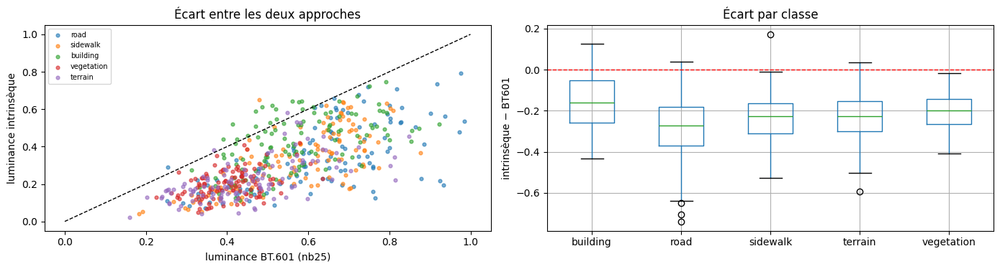

In [8]:
CITYSCAPES_ORDER = [
    "road", "sidewalk", "building", "wall", "fence", "pole", "traffic_light",
    "traffic_sign", "vegetation", "terrain", "sky", "person", "rider",
    "car", "truck", "bus", "train", "motorcycle", "bicycle",
]

def lum_bt601(rgb_float):
    return 0.299 * rgb_float[..., 0] + 0.587 * rgb_float[..., 1] + 0.114 * rgb_float[..., 2]

def load_sem(stem):
    f = SEM_MASKS_DIR / f"{stem}_sem.png"
    if f.exists():
        return cv2.imread(str(f), cv2.IMREAD_GRAYSCALE)
    return np.array(Image.open(LBL_DIR / f"{stem}.png"))   # repli sur le GT

rows = []
for p in image_paths:
    f_alb = ALBEDO_INT_DIR / f"{p.stem}_albedo_int.npy"
    if not f_alb.exists():
        continue
    rgb = cv2.cvtColor(cv2.imread(str(p)), cv2.COLOR_BGR2RGB).astype(np.float32) / 255.0
    alb = np.load(f_alb)
    if alb.shape[:2] != rgb.shape[:2]:
        alb = cv2.resize(alb, (rgb.shape[1], rgb.shape[0]), interpolation=cv2.INTER_LINEAR)
    sem = load_sem(p.stem)

    l_rgb = lum_bt601(rgb)
    l_int = lum_bt601(alb)
    # normalisation min-max de l'albedo intrinseque (defini a un facteur d'echelle pres)
    if l_int.max() > l_int.min():
        l_int = (l_int - l_int.min()) / (l_int.max() - l_int.min())

    for cid in (0, 1, 2, 8, 9):          # road, sidewalk, building, vegetation, terrain
        m = (sem == cid)
        if m.sum() < 500:
            continue
        rows.append(dict(image=p.stem, classe=CITYSCAPES_ORDER[cid],
                         lum_bt601=round(float(l_rgb[m].mean()), 4),
                         lum_intrinseque=round(float(l_int[m].mean()), 4),
                         ecart=round(float(l_int[m].mean() - l_rgb[m].mean()), 4)))

df_cmp = pd.DataFrame(rows)
df_cmp.to_csv(OUTPUT_DIR / "comparaison_luminance_vs_intrinseque.csv", index=False)

print("=== Ecart moyen par classe (intrinseque - BT601) ===")
print(df_cmp.groupby("classe")[["lum_bt601", "lum_intrinseque", "ecart"]].mean().round(3).to_string())
print("\n=== Dispersion de l'ecart (|ecart| eleve = forte contamination par les ombres) ===")
print(df_cmp.groupby("classe")["ecart"].apply(lambda s: s.abs().mean()).round(3).to_string())

fig, axes = plt.subplots(1, 2, figsize=(14, 4))
for c in df_cmp["classe"].unique():
    sub = df_cmp[df_cmp["classe"] == c]
    axes[0].scatter(sub["lum_bt601"], sub["lum_intrinseque"], s=12, alpha=0.6, label=c)
axes[0].plot([0, 1], [0, 1], "k--", lw=1)
axes[0].set_xlabel("luminance BT.601 (nb25)"); axes[0].set_ylabel("luminance intrinsèque")
axes[0].set_title("Écart entre les deux approches"); axes[0].legend(fontsize=7)

df_cmp.boxplot(column="ecart", by="classe", ax=axes[1])
axes[1].axhline(0, color="red", ls="--", lw=1)
axes[1].set_title("Écart par classe"); axes[1].set_xlabel(""); axes[1].set_ylabel("intrinsèque − BT601")
plt.suptitle(""); plt.tight_layout()
fig.savefig(OUTPUT_DIR / "comparaison_luminance.png", dpi=150)
plt.show()

## 6. Visualisation : original / albédo intrinsèque / shading

L'intérêt se voit à l'œil : sur l'albédo intrinsèque, **les ombres portées disparaissent** — un trottoir garde la même couleur qu'il soit au soleil ou à l'ombre. C'est exactement ce que la luminance BT.601 ne savait pas faire.

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [5.218045e-08..42.503643].


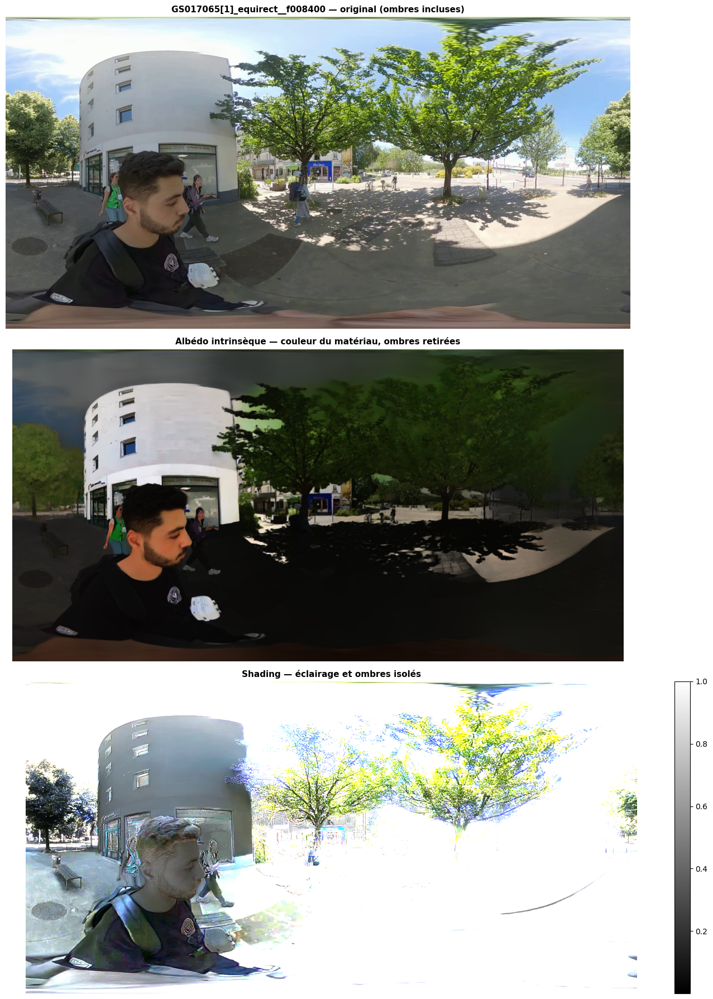

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [4.5434477e-05..14.141897].


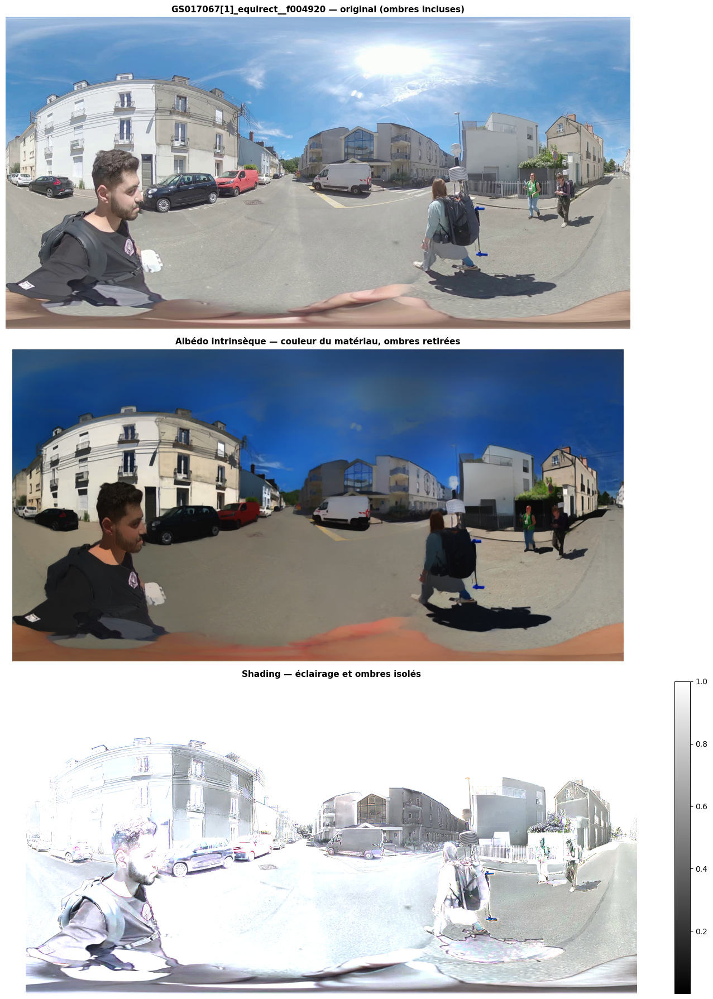

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [2.2247426e-09..18.919914].


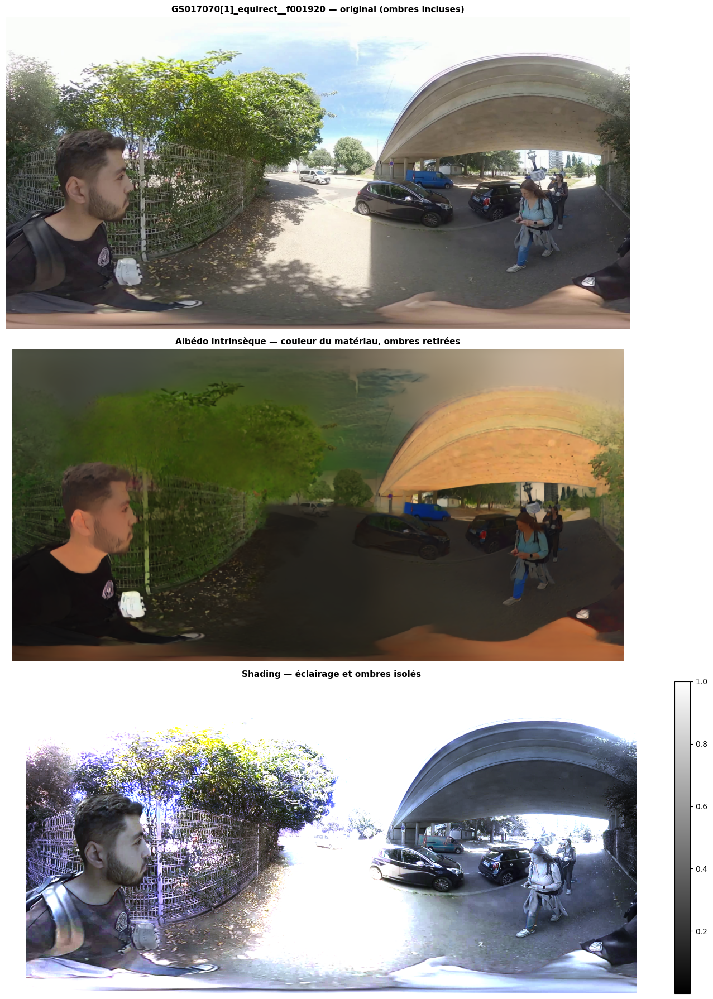

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [1.0470612e-05..12.752692].


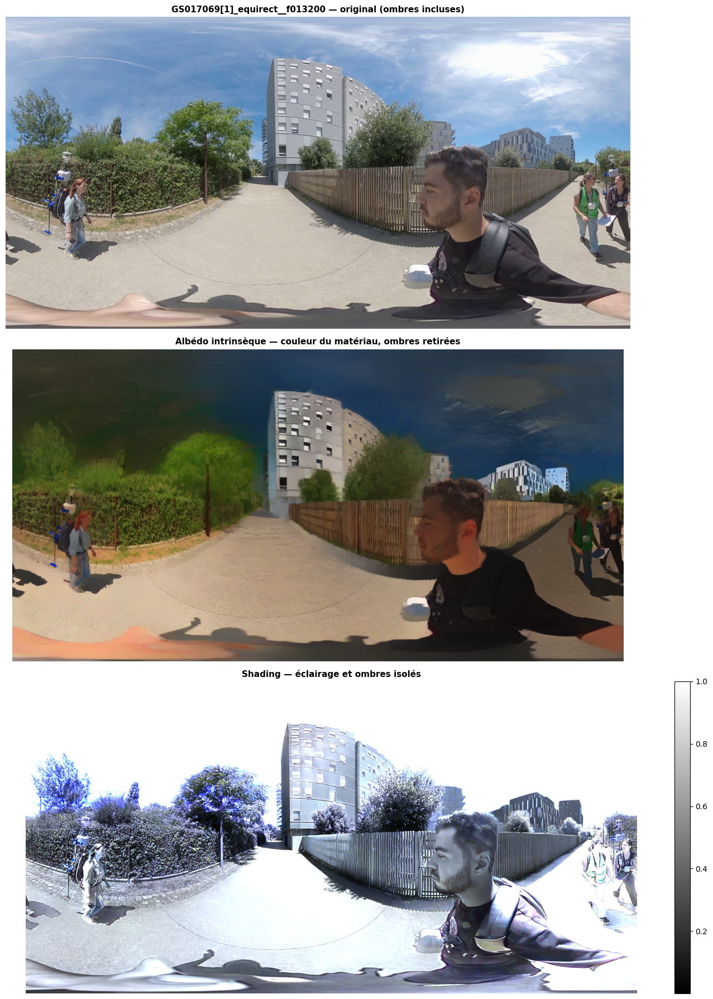

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [5.573884e-09..21.897482].


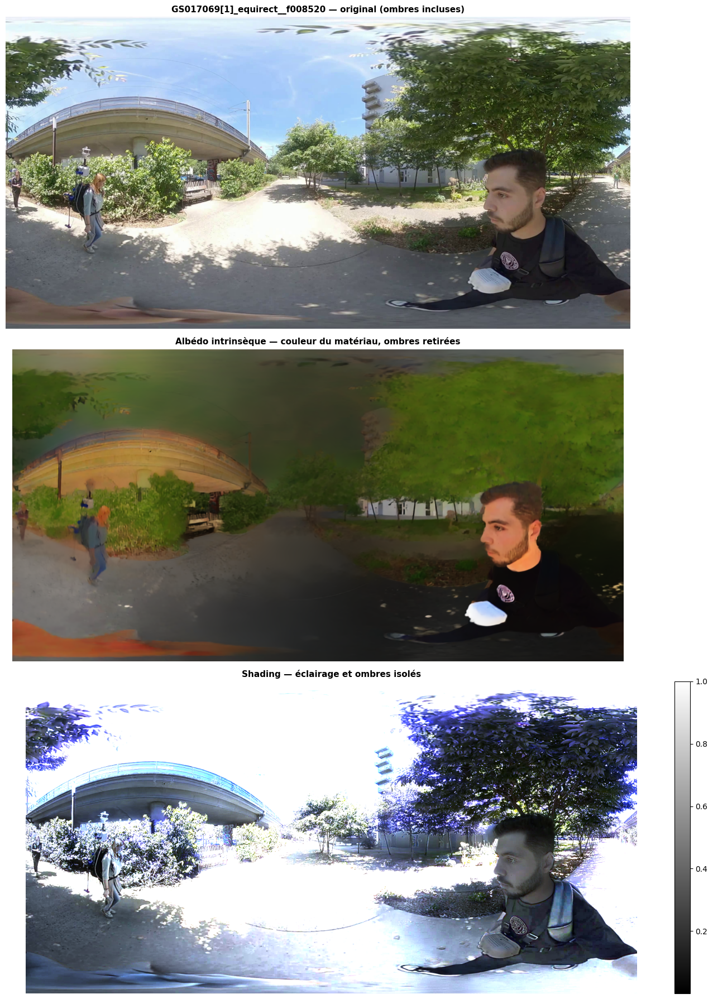

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [1.398212e-05..20.106218].


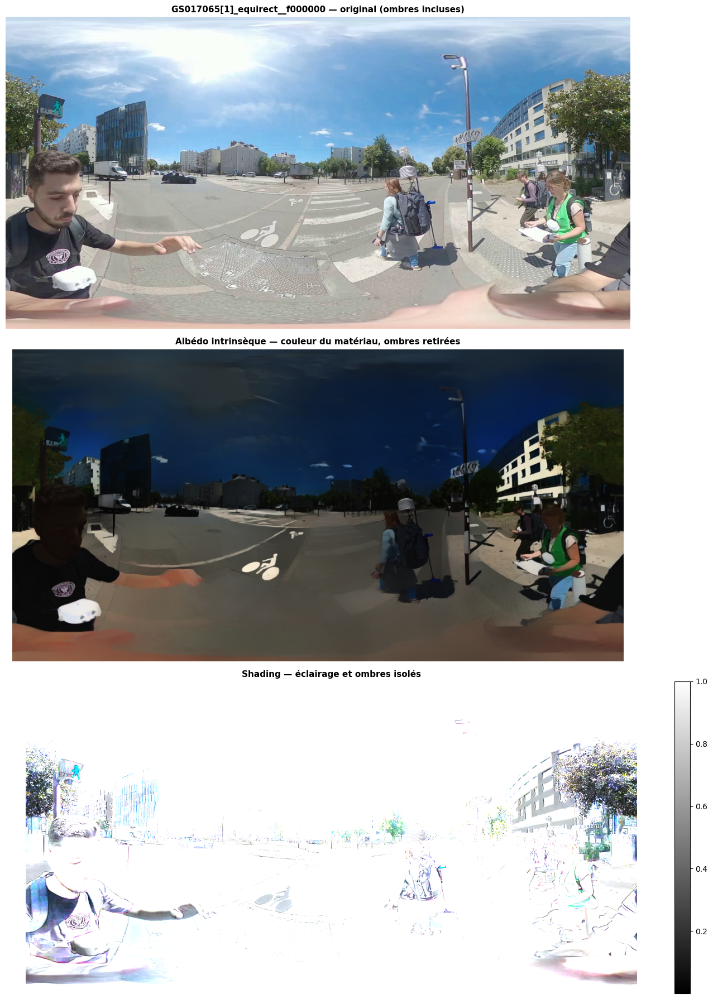

Visualisations : C:\Users\youss\Downloads\coolpath_local\data\outputs\intrinsic_color\viz


In [9]:
for p in random.Random(1).sample(image_paths, min(6, len(image_paths))):
    f_alb = ALBEDO_INT_DIR / f"{p.stem}_albedo_int.npy"
    if not f_alb.exists():
        continue
    rgb = cv2.cvtColor(cv2.imread(str(p)), cv2.COLOR_BGR2RGB)
    alb = np.load(f_alb)
    f_shd = SHADING_DIR / f"{p.stem}_shading.npy"
    shd = np.load(f_shd) if f_shd.exists() else None

    n = 3 if shd is not None else 2
    fig, axes = plt.subplots(n, 1, figsize=(14, 6 * n))

    axes[0].imshow(rgb)
    axes[0].set_title(f"{p.stem} — original (ombres incluses)", fontweight="bold", fontsize=11)

    alb_disp = np.clip(alb / max(alb.max(), 1e-6), 0, 1)
    axes[1].imshow(alb_disp)
    axes[1].set_title("Albédo intrinsèque — couleur du matériau, ombres retirées",
                      fontweight="bold", fontsize=11)

    if shd is not None:
        im = axes[2].imshow(np.squeeze(shd), cmap="gray")
        axes[2].set_title("Shading — éclairage et ombres isolés", fontweight="bold", fontsize=11)
        plt.colorbar(im, ax=axes[2], fraction=0.025)

    for ax in axes:
        ax.axis("off")
    plt.tight_layout()
    plt.savefig(VIZ_DIR / f"{p.stem}_intrinsic.png", dpi=95, bbox_inches="tight")
    plt.show()

print(f"Visualisations : {VIZ_DIR}")

## 7. Intégration dans le notebook 25

Pour remplacer la luminance BT.601 par l'albédo intrinsèque dans le pipeline de fusion, remplacer la fonction `load_color` du nb25 par :

```python
ALBEDO_INT_DIR = PROJECT_ROOT / "data" / "outputs" / "intrinsic_color" / "albedo_intrinsic"

def load_color(p):
    # Retourne (image RGB, luminance INTRINSEQUE 0-255) - ombres retirees (nb26)
    img_bgr = cv2.imread(str(p))
    rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)

    alb = np.load(ALBEDO_INT_DIR / f"{p.stem}_albedo_int.npy")
    if alb.shape[:2] != rgb.shape[:2]:
        alb = cv2.resize(alb, (rgb.shape[1], rgb.shape[0]), interpolation=cv2.INTER_LINEAR)

    lum = 0.299*alb[...,0] + 0.587*alb[...,1] + 0.114*alb[...,2]
    # l'albedo intrinseque est defini a un facteur d'echelle pres -> normalisation 0-255
    if lum.max() > lum.min():
        lum = (lum - lum.min()) / (lum.max() - lum.min()) * 255.0
    return rgb, lum
```

Le reste du nb25 (gating, table d'albédo, fusion) est **inchangé** — seule la source de la luminance change.

## 8. Limites et points à discuter avec les encadrants

**Ce que ce modèle apporte réellement**
- Il **retire les ombres** de l'estimation de couleur : c'est la correction du biais principal de la branche couleur du nb25 (quantifié section 5).
- Il est **pré-entraîné et publié** (ACM TOG 2023/2024) — pas une heuristique maison.

**Ce qu'il n'apporte pas — à ne pas surinterpréter**
1. L'albédo intrinsèque est un albédo **visible RGB**, défini **à un facteur d'échelle près** (l'IID est scale-invariant par nature). Ce n'est **pas** un albédo solaire large-bande (0,3–2,5 μm) mesurable au pyranomètre. La table d'albédo sourcée du nb25 reste indispensable pour l'ancrage physique.
2. La normalisation min-max appliquée ici est un choix **relatif à chaque image** : deux images différentes ne sont pas directement comparables en valeur absolue. À discuter si vous voulez une comparaison inter-images rigoureuse.
3. Le modèle est entraîné majoritairement sur des scènes **intérieures et perspective** — son comportement sur des images **équirectangulaires 360°** n'est pas garanti. Vérifier visuellement (section 6) qu'il n'y a pas d'artefacts aux pôles ou à la couture.

**Citation à inclure dans le rapport**
```
@ARTICLE{careagaIntrinsic,
  author  = {Chris Careaga and Yağız Aksoy},
  title   = {Intrinsic Image Decomposition via Ordinal Shading},
  journal = {ACM Trans. Graph.}, year = {2023},
  volume  = {43}, number = {1}, articleno = {12}, numpages = {24}
}
@ARTICLE{careagaColorful,
  author  = {Chris Careaga and Yağız Aksoy},
  title   = {Colorful Diffuse Intrinsic Image Decomposition in the Wild},
  journal = {ACM Trans. Graph.}, year = {2024},
  volume  = {43}, number = {6}, articleno = {178}, numpages = {12}
}
```
Licence : **usage académique uniquement**.